In [25]:
import ROOT
import numpy
import scipy.stats
import seaborn as sns
from mpl_toolkits.basemap import Basemap, shiftgrid
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.ticker import NullFormatter
import matplotlib.dates as mdates
from matplotlib.dates import MonthLocator, DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
from array import array as ary
import math
import pandas as pd
from pandas.tseries import converter
import datetime

import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

from IPython.display import display

pd.plotting.register_matplotlib_converters()

In [15]:
# https://scweb.cwb.gov.tw/
# df = pd.read_csv('Taiwan-Earthquake-History.csv',skipinitialspace=True)
df = pd.read_csv('Earthquake-Taiwan-19010607to20190514.csv',skipinitialspace=True)
# df = df.drop(df[(df.magnitude < 3.0)].index)
df.Date_Time = pd.to_datetime(df.Date_Time)

lat = df['Latitude'].values
lon = df['Longitude'].values
mag = df['Magnitude'].values
size = 3.**df['Magnitude'].values
dep = -1.*df['Depth'].values

df.sort_values(by = 'Magnitude').head()

,Date_Time,Longitude,Latitude,Magnitude,Depth
299434,2018-02-17 20:48:33,121.57,24.01,0.02,5.21
300084,2018-02-15 00:28:38,121.53,23.83,0.03,7.95
505447,2012-05-19 02:01:03,120.61,23.16,0.03,1.53
315193,2017-11-28 21:13:27,120.52,23.25,0.06,4.70
370114,2015-10-05 01:53:57,121.18,23.42,0.07,2.40


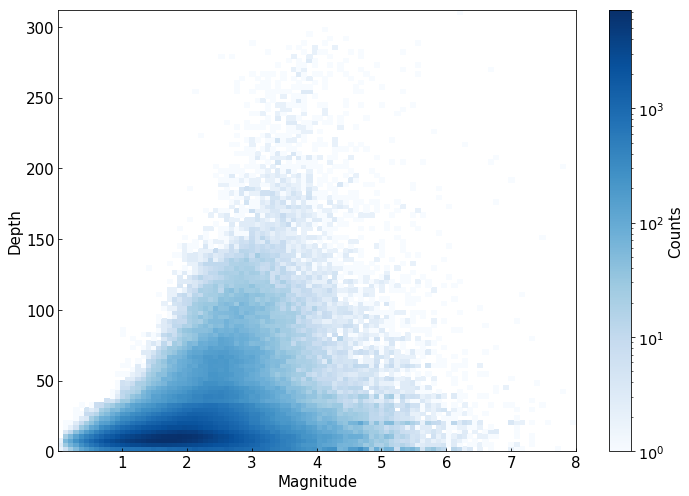

In [3]:
fig = plt.figure(figsize=(10,7))
ax = plt.gca()

plt.hist2d(mag, df['Depth'].values, bins=100, cmap='Blues', norm=LogNorm())

plt.xlabel('Magnitude', fontsize=15)
plt.ylabel('Depth', fontsize=15)
plt.tick_params(direction='in', axis='both' ,which='both', labelsize=15)

cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=15)
cbar.ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-Mag-Depth.pdf')
plt.savefig('Taiwan-Earthquake-Mag-Depth.png')
plt.show()

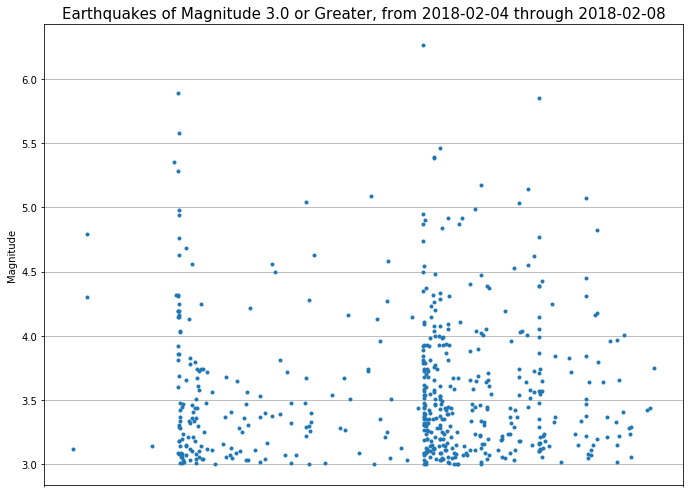

In [16]:
# https://risk-engineering.org/notebook/data-analysis-earthquakes.html

# start_remove = pd.to_datetime('1979-12-31 23:59:59')
# end_remove = pd.to_datetime('2015-12-31 23:59:59')
start_remove = pd.to_datetime('2018-02-04 00:00:00')
end_remove = pd.to_datetime('2018-02-09 00:00:00')

df_cut = df.drop(df[(df.Magnitude < 3.0)].index)
df_cut = df_cut.loc[df_cut.Date_Time > start_remove]
df_cut = df_cut.loc[df_cut.Date_Time < end_remove]
df_cut.sort_values('Date_Time', inplace=True)

fig = plt.figure(figsize=(10,7))
ax = plt.gca()

plt.plot(df_cut.Date_Time, df_cut.Magnitude, '.')
plt.ylabel("Magnitude")

ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator())


plt.grid(True)

starttime = '2018-02-04'
endtime = '2018-02-08'
title_string = "Earthquakes of Magnitude 3.0 or Greater, from %s through %s" % (starttime, endtime)

plt.title(title_string,fontsize=15)

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-Timeseries-2018Feb04to08-Mag3.pdf')
plt.savefig('Taiwan-Earthquake-Timeseries-2018Feb04to08-Mag3.png')
plt.show()

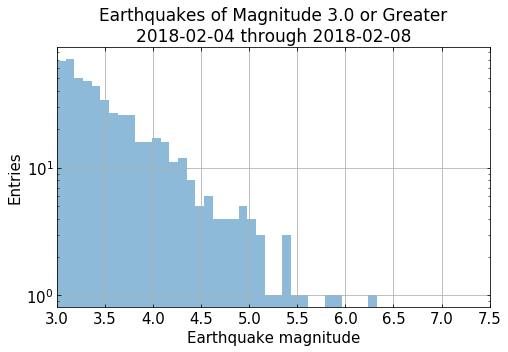

In [17]:
fig = plt.figure(figsize=(7,5))
ax = plt.gca()

df_cut.Magnitude.hist(alpha=0.5, range=[3,7.5], log=True, bins=50)
# ax.set_yscale('log')

plt.xlim(3,7.5)

plt.xlabel('Earthquake magnitude',fontsize=15)
plt.ylabel('Entries',fontsize=15)
plt.tick_params(direction='in', axis='both' ,which='both', labelsize=15)
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')

# starttime = '1980-01-01'
# endtime = '2015-12-31'
title_string = "Earthquakes of Magnitude 3.0 or Greater\n"
title_string += "%s through %s" % (starttime, endtime)

plt.title(title_string,fontsize=17)

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-Mag-2018Feb04to08.pdf')
plt.savefig('Taiwan-Earthquake-Mag--2018Feb04to08.png')
plt.show()

In [19]:
duration = df_cut.Date_Time.max() - df_cut.Date_Time.min()
print (len(df_cut),float(duration.days))
density = len(df_cut) / float(duration.days)
density  # events per day

535 4.0


133.75

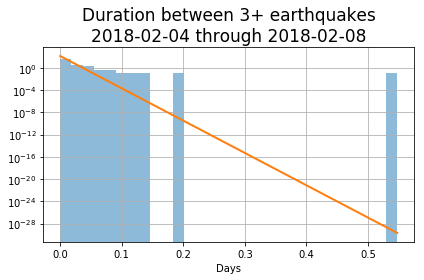

In [20]:
interarrival = df_cut.Date_Time.diff().dropna().apply(lambda x: x / numpy.timedelta64(1, 'D'))
support = numpy.linspace(interarrival.min(), interarrival.max(), 100)
interarrival.hist(density=True, alpha=0.5, bins=30, log=True)
plt.plot(support, scipy.stats.expon(scale=1/density).pdf(support), lw=2)
# plt.title("Duration between 3+ earthquakes", weight='bold')
plt.xlabel("Days")

title_string = "Duration between 3+ earthquakes\n"
title_string += "%s through %s" % (starttime, endtime)

plt.title(title_string,fontsize=17)

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-Duration-between-3+earthquakes-2018Feb04to08.pdf')
plt.savefig('Taiwan-Earthquake-Duration-between-3+earthquakes-2018Feb04to08.png')
plt.show()

# plt.xlim(0,8)

Text(0.5, 1.0, 'Exponential QQ-plot of interarrival time')

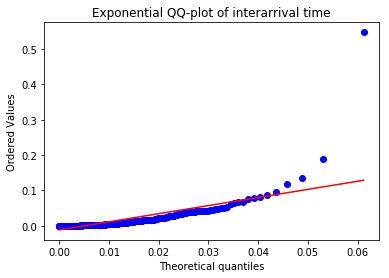

In [21]:
shape, loc = scipy.stats.expon.fit(interarrival)
scipy.stats.probplot(interarrival, dist="expon", sparams=(shape, loc), plot=plt.figure().add_subplot(111))
plt.title("Exponential QQ-plot of interarrival time")

Text(0.5, 1.0, 'Autocorrelation of earthquake timeseries data')

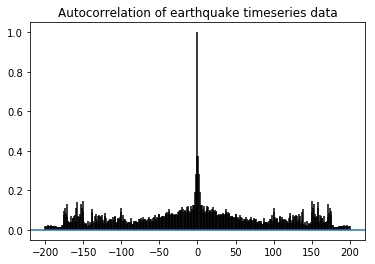

In [22]:
plt.acorr(interarrival, maxlags=200)
plt.title("Autocorrelation of earthquake timeseries data")

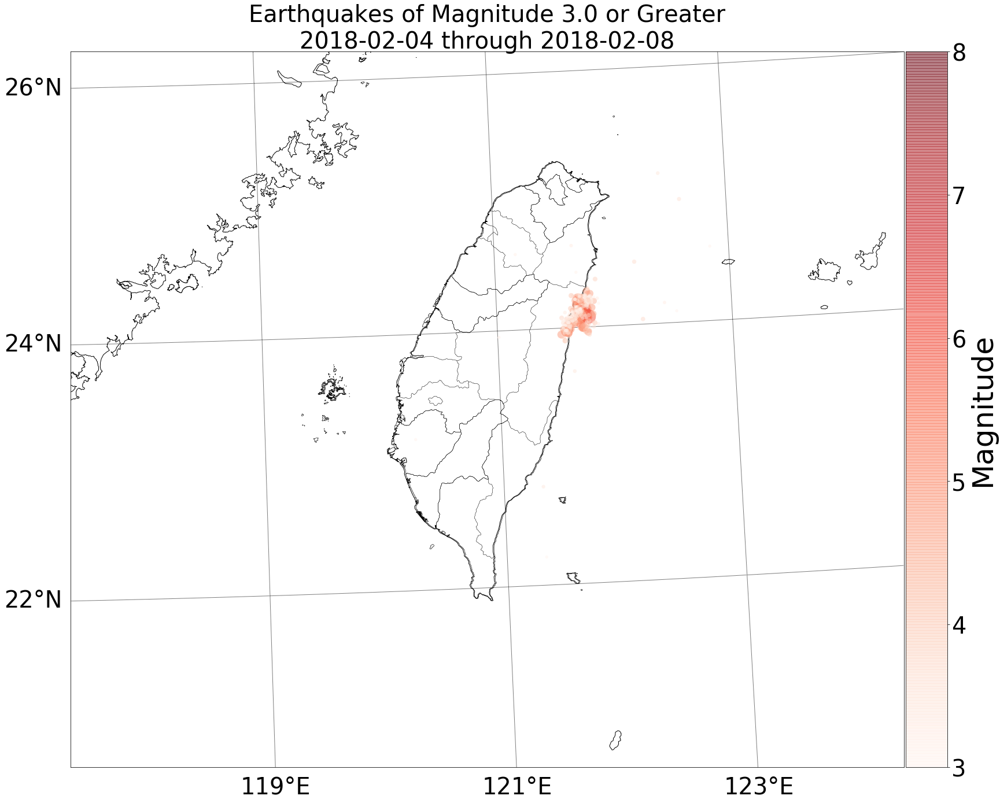

In [23]:
# start_remove = pd.to_datetime('1979-12-31 23:59:59')
# end_remove = pd.to_datetime('2019-12-31 23:59:59')
start_remove = pd.to_datetime('2018-02-04 00:00:00')
end_remove = pd.to_datetime('2018-02-09 00:00:00')

df_mag = df.drop(df[(df.Magnitude < 3.0)].index)

df_mag = df_mag.loc[df_mag.Date_Time > start_remove]
df_mag = df_mag.loc[df_mag.Date_Time < end_remove]
df_mag.sort_values('Date_Time', inplace=True)

lat = df_mag['Latitude'].values
lon = df_mag['Longitude'].values
mag = df_mag['Magnitude'].values
size = 3.**df_mag['Magnitude'].values
dep = -1.*df_mag['Depth'].values

fig = plt.figure(figsize=(24,20))
ax = plt.gca()

map = Basemap(llcrnrlon = 117.3, llcrnrlat = 20.7, urcrnrlon = 124.6, urcrnrlat = 26, resolution = 'h', epsg = 3415)
map.readshapefile('gadm36_TWN_shp/gadm36_TWN_1',name='Taiwan',linewidth=0.3,drawbounds=True)
map.readshapefile('gadm36_TWN_shp/gadm36_TWN_2',name='Taiwan',linewidth=0.3,drawbounds=True)
# map.drawmapboundary(fill_color = 'aqua')
# map.fillcontinents(lake_color = 'aqua')
map.drawcoastlines()

lons, lats = map(lon, lat)
# colormap reference: https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html
scat = map.scatter(lons, lats, s=size, c=mag, cmap='Reds', alpha=0.5, zorder = 10, linewidth=0.0)
map.drawparallels(numpy.arange(18,28,2),labels=[1,0,0,1], fontsize=40)
map.drawmeridians(numpy.arange(115,125,2),labels=[1,1,0,1], fontsize=40)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

cb = plt.colorbar(scat, cax=cax)
cb.set_label('Magnitude', size=50)
cb.ax.tick_params(labelsize=40)
plt.clim(3,8)

starttime = '2018-02-04'
endtime = '2018-02-08'
title_string = "Earthquakes of Magnitude 3.0 or Greater\n"
title_string += "%s through %s" % (starttime, endtime)
ax.set_title(title_string,fontsize=40)

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-History-Mag3-2018Feb04to08.pdf')
plt.savefig('Taiwan-Earthquake-History-Mag3-2018Feb04to08.png')

plt.show()


In [28]:
heat_quake_map = folium.Map(location=[24, 121], zoom_start=7.5)
latlons = df_mag[['Latitude', 'Longitude']].values.tolist()

HeatMap(latlons).add_to(heat_quake_map)

heat_quake_map.save('heat-quake-map-Mag3-2018Feb04to08.html')
heat_quake_map

In [29]:
tw_quake_map = folium.Map(location=[24, 121], zoom_start=7.5)
tw_quake_map.add_child(FastMarkerCluster(df_mag[['Latitude', 'Longitude']].values.tolist()))
tw_quake_map.save('Marker-quake-map-Mag3-2018Feb04to08.html')
tw_quake_map

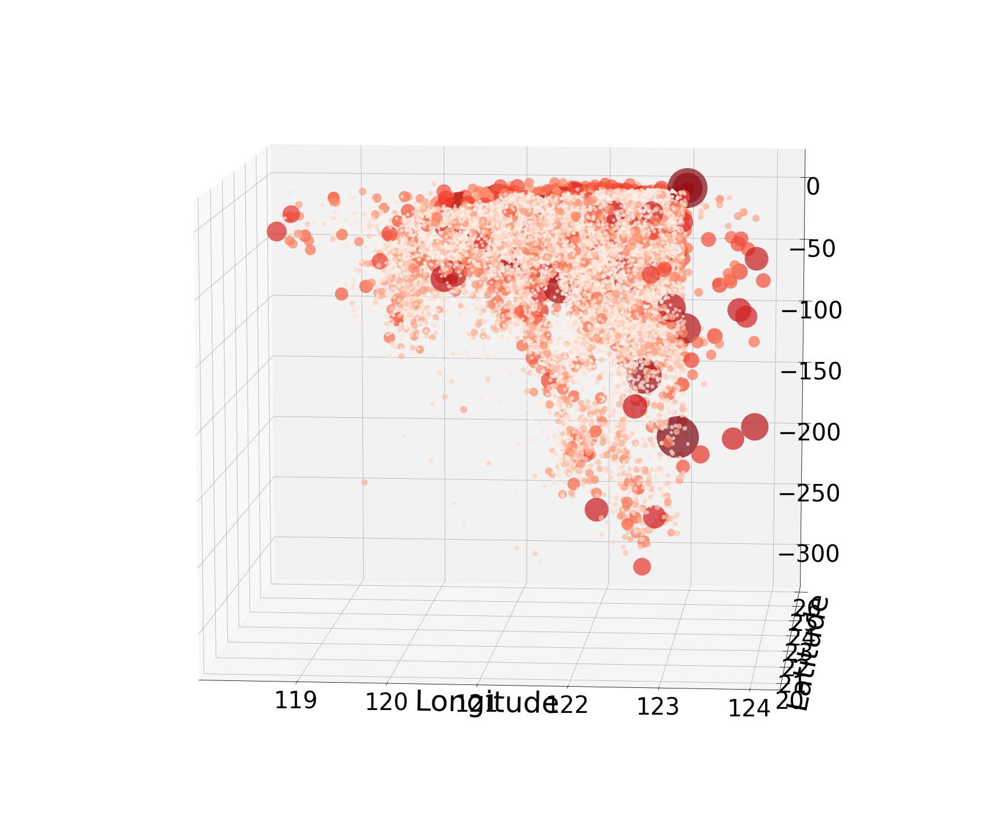

In [5]:
df_mag = df.drop(df[(df.Magnitude < 3.0)].index)

lat = df_mag['Latitude'].values
lon = df_mag['Longitude'].values
mag = df_mag['Magnitude'].values
size = 3.**df_mag['Magnitude'].values
dep = -1.*df_mag['Depth'].values

fig = plt.figure(figsize=(24,20))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(lon, lat, dep, s=size, c=mag, cmap='Reds', alpha=0.7, linewidth=0.0, marker='o')

plt.xlabel('Longitude', size=50)
plt.ylabel('Latitude', size=50)
plt.tick_params(direction='in', axis='both' ,which='both', labelsize=40)

ax.view_init(10, 275)

plt.tight_layout()
plt.savefig('Taiwan-Earthquake-3Dmap.pdf',bbox_inches = 'tight')
plt.savefig('Taiwan-Earthquake-3Dmap.png',bbox_inches = 'tight')
plt.show()

In [2]:
# Global earthquate: https://earthquake.usgs.gov/earthquakes/search/
# df_global = pd.read_csv('Earthquake-world-20190814to1113.csv',skipinitialspace=True)
df_global = pd.read_csv('Earthquake-world-2019-mag0.csv',skipinitialspace=True)

starttime = '2019-01-01'
endtime = '2019-11-14'

df_global.sort_values(by = 'mag').head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
57587,2019-06-22T05:25:00.960Z,38.774500,-122.742000,0.84,0.0,md,14.0,126.00,0.009649,0.0600,...,2019-06-25T08:22:02.808Z,"1km ESE of The Geysers, CA",earthquake,0.32,0.38,0.212,2.0,reviewed,nc,nc
61425,2019-06-12T07:16:24.706Z,39.328600,-119.935400,0.00,0.0,ml,3.0,182.81,0.086000,0.0799,...,2019-06-12T23:01:19.992Z,"9km NNE of Incline Village, Nevada",earthquake,NaN,0.00,0.130,2.0,reviewed,nn,nn
10496,2019-01-01T18:05:57.333Z,38.424200,-118.470900,2.00,0.0,ml,5.0,160.08,0.106000,0.1036,...,2019-01-02T20:22:22.865Z,"17km SE of Hawthorne, Nevada",earthquake,NaN,5.80,0.000,1.0,reviewed,nn,nn
49834,2019-05-13T13:38:13.136Z,37.231100,-116.718300,0.00,0.0,ml,6.0,224.53,0.310000,0.1619,...,2019-05-14T00:09:54.261Z,"35km N of Beatty, Nevada",earthquake,NaN,0.00,0.690,4.0,reviewed,nn,nn
61441,2019-06-12T06:44:52.280Z,44.343333,-110.526833,4.97,0.0,md,7.0,223.00,0.047930,0.1300,...,2019-06-12T15:29:43.270Z,"27km ESE of Old Faithful Geyser, Wyoming",earthquake,0.98,0.55,0.283,4.0,reviewed,uu,uu


(0, 10)

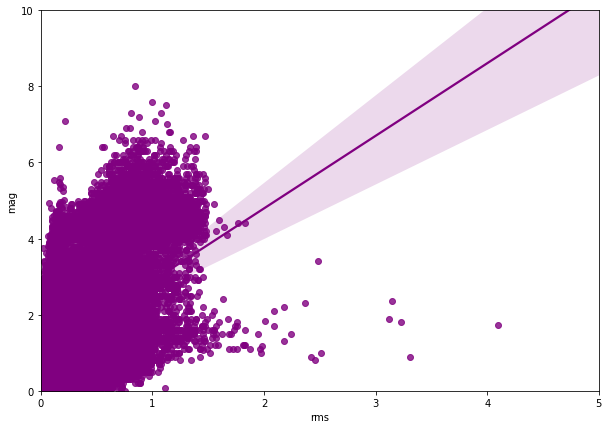

In [3]:
fig = plt.figure(figsize=(10,7))
ax = plt.gca()

sns.regplot(x= df_global['rms'], y= df_global['mag'], data = df_global, color = 'purple')
plt.xlim(0,5)
plt.ylim(0,10)

In [30]:
global_heat_quake_map = folium.Map(location=[0, 0], zoom_start=10)
latlons = df_global[['latitude', 'longitude']].values.tolist()

HeatMap(latlons).add_to(global_heat_quake_map)

global_heat_quake_map.save('heat-quake-map-global-Mag0-2019.html')
global_heat_quake_map

In [31]:
global_quake_map = folium.Map(location=[0, 0], zoom_start=10)
global_quake_map.add_child(FastMarkerCluster(df_global[['latitude', 'longitude']].values.tolist()))
global_quake_map.save('Marker-quake-map-global-Mag0-2019.html')
global_quake_map

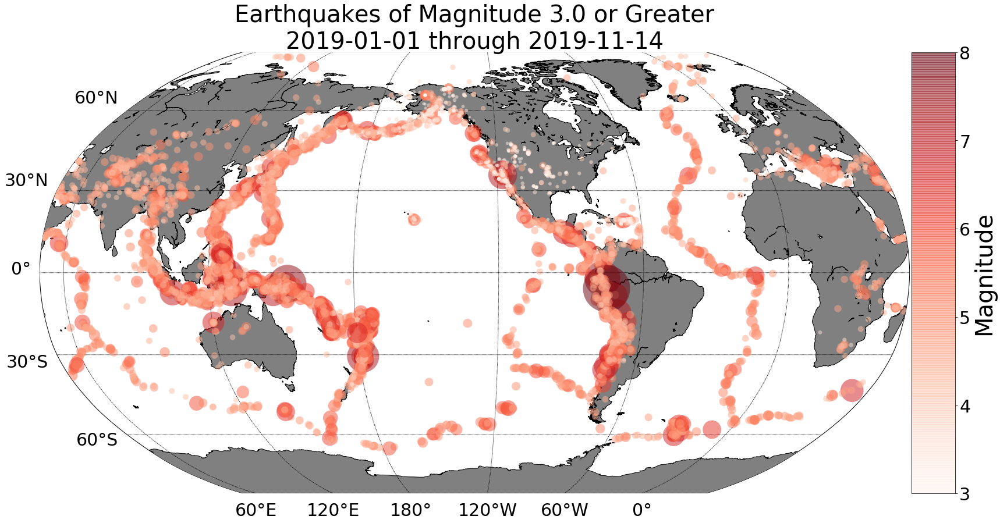

In [23]:
# http://introtopython.org/visualization_earthquakes.html
# https://matplotlib.org/basemap/users/examples.html
mag_cut = 3.0
df_global_mag = df_global.drop(df_global[(df_global.mag < mag_cut)].index)

lat = df_global_mag['latitude'].values
lon = df_global_mag['longitude'].values
mag = df_global_mag['mag'].values
size = 3.**df_global_mag['mag'].values
dep = -1.*df_global_mag['depth'].values

fig = plt.figure(figsize=(24,20))
ax = plt.gca()

map = Basemap(projection='robin',resolution = 'l', area_thresh = 1000.0, lat_0=0, lon_0=-130)
map.drawcoastlines()
map.fillcontinents(color = 'gray')

lons, lats = map(lon, lat)
scat = map.scatter(lons, lats, s=size, c=mag, cmap='Reds', alpha=0.5, zorder = 10, linewidth=0.0)
map.drawparallels(np.arange(-90,90,30),labels=[1,0,0,1], fontsize=30)
map.drawmeridians(np.arange(0,360,60),labels=[1,1,0,1], fontsize=30)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

cb = plt.colorbar(scat, cax=cax)
cb.set_label('Magnitude', size=40)
cb.ax.tick_params(labelsize=30)

plt.clim(3,8)

title_string = "Earthquakes of Magnitude 3.0 or Greater\n"
title_string += "%s through %s" % (starttime, endtime)
ax.set_title(title_string,fontsize=40)

plt.tight_layout()
plt.savefig('Global--Earthquake-2019-Mag3.png',bbox_inches = 'tight')
plt.savefig('Global--Earthquake-2019-Mag3.pdf',bbox_inches = 'tight')

plt.show()